# Import

In [ ]:
import os, csv
import json

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

from pycocotools.coco import COCO
from pycocotools import mask


# Dataset

In [ ]:
def rle_to_mask(rle):
    """
    COCO形式のRLEから2Dのバイナリマスクを生成
    非圧縮RLEと圧縮RLEの両方に対応
    """
    if isinstance(rle['counts'], list):
        # 非圧縮RLE → frPyObjects で整形してから decode
        rle_obj = mask.frPyObjects(rle, rle['size'][0], rle['size'][1])
        binary_mask = mask.decode(rle_obj)
    else:
        # 圧縮RLE（通常はAPI経由で取得した場合）→ そのまま decode
        binary_mask = mask.decode(rle)

    # 結果のshapeが (H, W, 1) の場合は squeeze
    if binary_mask.ndim == 3:
        binary_mask = binary_mask[:, :, 0]

    return binary_mask.astype(np.uint8)

In [ ]:
def get_transform():
    return T.Compose([T.ToTensor()])

In [ ]:
"""
target{
  "boxes":,
  "labels":,
  "masks":,
}
"""
class PlantsDataset(Dataset):
  def __init__(self, root, transform):
    self.root = root
    self.transform = transform
    self.imgs_files = sorted(os.listdir(os.path.join(root, "images")))
    self.annotations_files = sorted(os.listdir(os.path.join(root, "annotations")))

  def __getitem__(self, idx):
    img_path = os.path.join(self.root, "images", self.imgs_files[idx])
    annotations_path = os.path.join(self.root, "annotations", self.annotations_files[idx])

    # 画像の読み込み
    img_original = cv2.imread(img_path)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)
    if self.transform:
      img_original = self.transform(img_original)

    # アノテーションデータの読み込み
    with open(annotations_path) as f:
      data = json.load(f)
      bboxs = []
      labels = []
      masks =  []

      for ann in data["annotations"].values():
        bboxs.append(ann["bbox"])
        labels.append(ann["category_id"])
        mask_raw = ann["segmentation"]
        mask = rle_to_mask(mask_raw)
        masks.append(mask)

    bboxs = torch.as_tensor(bboxs, dtype=torch.float32)
    labels = torch.as_tensor(labels, dtype=torch.int64)
    # height, width = img_original.shape[:2]
    # masks = torch.as_tensor(masks, dtype=torch.uint8) if masks else torch.zeros((len(bboxs), height, width), dtype=torch.uint8)
    masks = torch.from_numpy(np.stack(masks)).to(dtype=torch.uint8)


    target = {
        "boxes": bboxs,
        "labels":labels,
        "masks":masks,
    }

    return img_original, target

  def __len__(self):
        return len(self.imgs_files)

# DataLoader

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [ ]:
TRAIN_DIR = "/content/drive/MyDrive/Mask_R_CNN_plants/processed/train"
VAL_DIR = "/content/drive/MyDrive/Mask_R_CNN_plants/processed/validation"

train_dataset = PlantsDataset(TRAIN_DIR,transform=get_transform())
valdation_dataset = PlantsDataset(VAL_DIR,transform=get_transform())

train_loader = DataLoader(
    train_dataset, batch_size=2, shuffle=True, num_workers=2, collate_fn=collate_fn
)
validation_loader = DataLoader(
    valdation_dataset, batch_size=2, shuffle=False, num_workers=2, collate_fn=collate_fn
)

In [ ]:
images, targets = next(iter(train_loader))

print("Image shape:", images[0].shape)
print("Target keys:", targets[0].keys())
print("Boxes:", targets[0]["boxes"])
print("Labels:", targets[0]["labels"])
print("Masks shape:", targets[0]["masks"].shape)

Image shape: (3456, 5184, 3)
Target keys: dict_keys(['boxes', 'labels', 'masks'])
Boxes: tensor([[2396.,  270., 3463.,  730.],
        [1876.,  666., 2660., 1193.],
        [1681.,  290., 2448.,  798.],
        [1314., 1129., 2071., 1726.]])
Labels: tensor([1, 1, 1, 1])
Masks shape: torch.Size([4, 3456, 5184])


In [ ]:
def visualize_instance_data(image_np, data, score_threshold=0.5, is_prediction=False, show_labels=False):
    """
    学習データまたは推論結果のインスタンス情報を画像に重ねて可視化する。

    Args:
        image_np: numpy.ndarray (H, W, C) - 可視化対象のRGB画像
        data: dict - 'boxes', 'masks', 'labels' を含む辞書。GTでも予測でも可。
        score_threshold: float - 推論時の表示スコアしきい値
        is_prediction: bool - 推論結果ならTrue、GTならFalse
        show_labels: bool - ラベルIDとスコアを表示するか
    """

    plt.figure(figsize=(10, 10))
    plt.imshow(image_np)
    ax = plt.gca()

    # 必要な要素の抽出
    boxes = data["boxes"].cpu().numpy() if isinstance(data["boxes"], torch.Tensor) else data["boxes"]
    labels = data["labels"].cpu().numpy() if isinstance(data["labels"], torch.Tensor) else data["labels"]

    if "masks" in data:
        masks = data["masks"]
        if isinstance(masks, torch.Tensor):
            masks = masks.cpu().numpy()

    if is_prediction:
        scores = data.get("scores", None)
        if scores is not None:
            scores = scores.cpu().numpy() if isinstance(scores, torch.Tensor) else scores

    # 描画
    for i in range(len(boxes)):
        if is_prediction and scores is not None and scores[i] < score_threshold:
            continue

        x1, y1, x2, y2 = boxes[i]
        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                             fill=False, edgecolor='lime' if is_prediction else 'red', linewidth=2)
        ax.add_patch(rect)

        if show_labels:
            label_text = f"ID:{labels[i]}"
            if is_prediction and scores is not None:
                label_text += f" ({scores[i]:.2f})"
            ax.text(x1, y1 - 5, label_text,
                    bbox=dict(facecolor='yellow', alpha=0.5), fontsize=10)

        if "masks" in data:
            mask = masks[i] if masks.ndim == 3 else masks[i, 0]  # 推論は [N, 1, H, W]
            if is_prediction:
                mask = (mask > 0.5).astype(np.uint8)  # 2値化
            masked = np.ma.masked_where(mask == 0, mask)
            plt.imshow(masked, cmap='viridis', alpha=0.7)

    plt.axis('on')
    plt.title("Prediction" if is_prediction else "Ground Truth")
    plt.show()

In [ ]:
images, targets = next(iter(train_loader))

print("Image shape:", images[0].shape)
print("Target keys:", targets[0].keys())
print("Boxes:", targets[0]["boxes"])
print("Labels:", targets[0]["labels"])
print("Masks shape:", targets[0]["masks"].shape)

Image shape: (3456, 5184, 3)
Target keys: dict_keys(['boxes', 'labels', 'masks'])
Boxes: tensor([[1264.,  682., 2410., 1283.],
        [2393.,  585., 3480., 1266.],
        [1600., 1279., 2914., 2129.],
        [2552., 1929., 3632., 2606.]])
Labels: tensor([1, 1, 1, 1])
Masks shape: torch.Size([4, 3456, 5184])


In [ ]:
TRAIN_DIR = "/content/drive/MyDrive/Mask_R_CNN_plants/processed/train"
VAL_DIR = "/content/drive/MyDrive/Mask_R_CNN_plants/processed/validation"

train_dataset = PlantsDataset(TRAIN_DIR,transform=get_transform())
valdation_dataset = PlantsDataset(VAL_DIR,transform=get_transform())

train_loader = DataLoader(
    train_dataset, batch_size=2, shuffle=True, num_workers=2, collate_fn=collate_fn
)
validation_loader = DataLoader(
    valdation_dataset, batch_size=2, shuffle=False, num_workers=2, collate_fn=collate_fn
)

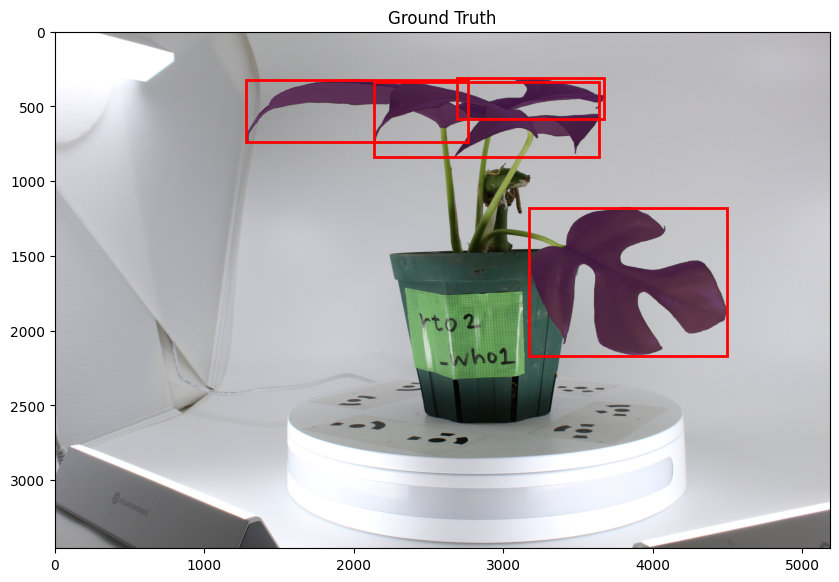

In [ ]:
images, targets = next(iter(train_loader))

image_np = images[0] if isinstance(images[0], np.ndarray) else images[0].permute(1, 2, 0).cpu().numpy()
target_data = targets[0]

visualize_instance_data(image_np, target_data, is_prediction=False, show_labels=False)

# Training

In [ ]:
# ラーニングカーブ描画用関数
def plot_learning_curve(train_losses, val_losses):
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, len(train_losses)+1), train_losses, label="Train Loss")
    plt.plot(range(1, len(val_losses)+1), val_losses, label="Val Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training & Validation Loss Curve")
    plt.legend()
    plt.grid()
    plt.show()

In [ ]:
"""
・ResNetバックボーン(特徴抽出器)は ImageNet学習済み
・分類・マスクヘッド(検出器部分)は再初期化して、自前データに合わせて学習
"""

def get_model_instance_segmentation(num_classes):
    model = maskrcnn_resnet50_fpn(pretrained=True)  # ImageNetで事前学習済み

    # 分類ヘッドの差し替え
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # マスク予測ヘッドの差し替え
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask, hidden_layer, num_classes)

    return model


In [ ]:
def train_model_with_validation(model, train_loader, val_loader, device, optimizer,
                                start_epoch=0, num_epochs=100, checkpoint_interval=50,
                                save_dir=None, loss_log_path=None):

    model.to(device)
    train_losses, val_losses = [], []
    for epoch in range(start_epoch, num_epochs):
        model.train()
        epoch_train_loss = 0.0
        for images, targets in train_loader:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)
            loss = sum(loss for loss in loss_dict.values())

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_train_loss += loss.item()
        avg_train_loss = epoch_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # --- validation ---
        model.train()
        epoch_val_loss = 0.0
        with torch.no_grad():
            for images, targets in val_loader:
                images = [img.to(device) for img in images]
                targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

                loss_dict = model(images, targets)
                loss = sum(loss for loss in loss_dict.values())
                epoch_val_loss += loss.item()
        avg_val_loss = epoch_val_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}]  Train Loss: {avg_train_loss:.4f}  Val Loss: {avg_val_loss:.4f}")

        # --- ログ書き込み ---
        with open(loss_log_path, "a", newline="") as f:
            writer = csv.writer(f)
            if epoch == start_epoch:
                writer.writerow(["epoch", "train_loss", "val_loss"])
            writer.writerow([epoch + 1, avg_train_loss, avg_val_loss])

        # --- モデル保存 ---
        if (epoch + 1) % checkpoint_interval == 0 or (epoch + 1) == num_epochs:
            ckpt_path = os.path.join(save_dir, f"model_epoch{epoch+1}.pth")
            torch.save(model.state_dict(), ckpt_path)

    # --- ラーニングカーブ描画 ---
    plot_learning_curve(train_losses, val_losses)

In [ ]:
TRAIN_DIR = "/content/drive/MyDrive/Mask_R_CNN_plants/processed/train"
VAL_DIR = "/content/drive/MyDrive/Mask_R_CNN_plants/processed/validation"

train_dataset = PlantsDataset(TRAIN_DIR,transform=get_transform())
valdation_dataset = PlantsDataset(VAL_DIR,transform=get_transform())

train_loader = DataLoader(
    train_dataset, batch_size=5, shuffle=True, num_workers=2, collate_fn=collate_fn
)
validation_loader = DataLoader(
    valdation_dataset, batch_size=5, shuffle=False, num_workers=2, collate_fn=collate_fn
)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/100]  Train Loss: 1.6882  Val Loss: 0.9362
Epoch [2/100]  Train Loss: 0.7546  Val Loss: 0.6793
Epoch [3/100]  Train Loss: 0.5006  Val Loss: 0.5437
Epoch [4/100]  Train Loss: 0.3728  Val Loss: 0.4944
Epoch [5/100]  Train Loss: 0.3212  Val Loss: 0.4903
Epoch [6/100]  Train Loss: 0.2832  Val Loss: 0.4839
Epoch [7/100]  Train Loss: 0.2591  Val Loss: 0.4784
Epoch [8/100]  Train Loss: 0.2428  Val Loss: 0.4723
Epoch [9/100]  Train Loss: 0.2250  Val Loss: 0.4713
Epoch [10/100]  Train Loss: 0.2177  Val Loss: 0.4739
Epoch [11/100]  Train Loss: 0.2145  Val Loss: 0.4981
Epoch [12/100]  Train Loss: 0.2047  Val Loss: 0.4471
Epoch [13/100]  Train Loss: 0.2027  Val Loss: 0.4851
Epoch [14/100]  Train Loss: 0.1952  Val Loss: 0.4651
Epoch [15/100]  Train Loss: 0.1882  Val Loss: 0.4779
Epoch [16/100]  Train Loss: 0.1841  Val Loss: 0.4727
Epoch [17/100]  Train Loss: 0.1789  Val Loss: 0.4836
Epoch [18/100]  Train Loss: 0.1750  Val Loss: 0.4712
Epoch [19/100]  Train Loss: 0.1767  Val Loss: 0.4990
Ep

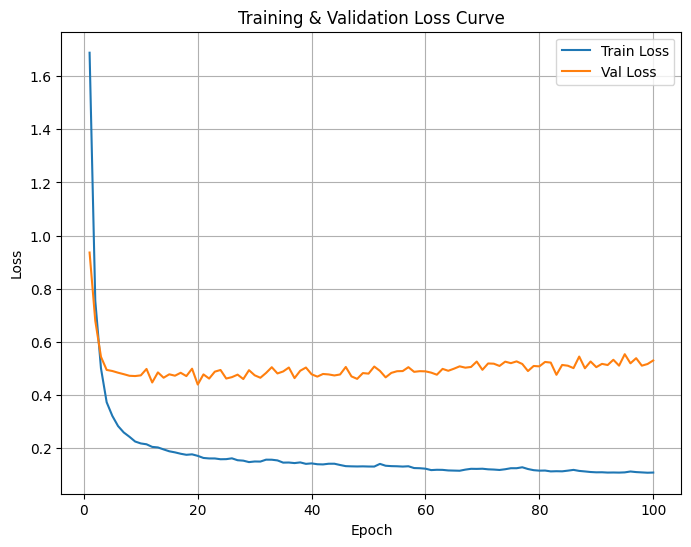

In [ ]:
num_classes = 2
model = get_model_instance_segmentation(num_classes)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

optimizer = torch.optim.SGD([p for p in model.parameters() if p.requires_grad],
                            lr=0.005, momentum=0.9, weight_decay=0.0005)

train_model_with_validation(model,
                            train_loader=train_loader,
                            val_loader=validation_loader,
                            device=device,
                            optimizer=optimizer,
                            num_epochs=100,
                            checkpoint_interval=20,
                            save_dir="/content/drive/MyDrive/Mask_R_CNN_plants/processed",
                            loss_log_path="/content/drive/MyDrive/Mask_R_CNN_plants/processed/loss_log.csv")

# Prediction

In [ ]:
def run_inference_on_directory(model, image_dir, device, score_threshold=0.5, visualize=True):
    model.eval()
    transform = T.Compose([T.ToTensor()])

    image_files =  sorted(os.listdir(image_dir))

    for file_name in image_files:
        img_path = os.path.join(image_dir, file_name)

        # 画像読み込み（OpenCV→RGB→Tensor）
        img_bgr = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        img_tensor = transform(img_rgb).to(device)

        with torch.no_grad():
            prediction = model([img_tensor])[0]

        # スコアでフィルタリング
        keep = prediction['scores'] >= score_threshold
        filtered_prediction = {
            k: v[keep] for k, v in prediction.items()
        }

        # 可視化
        if visualize:
            print(f"==> {file_name} - Detected {len(filtered_prediction['boxes'])} instances")
            visualize_instance_data(img_rgb, filtered_prediction, is_prediction=True, show_labels=False)

==> SSP_c01_s001_b0001.JPG - Detected 3 instances


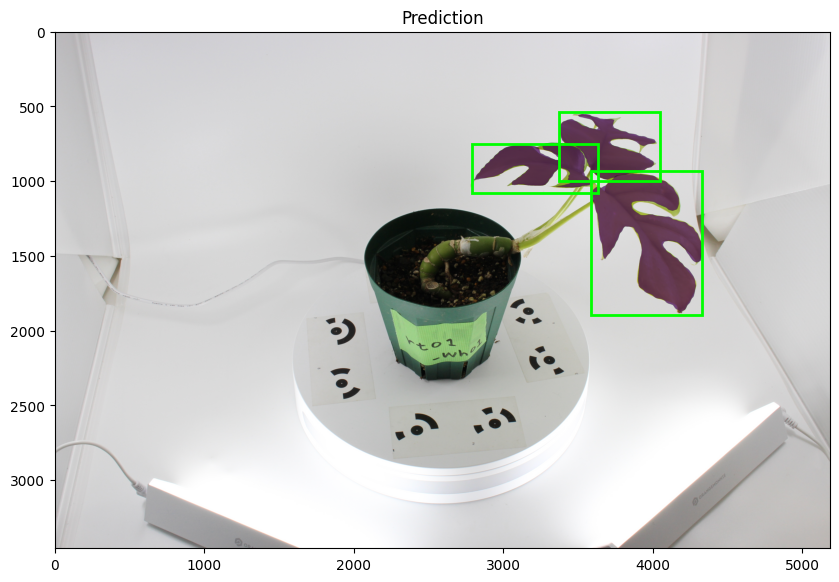

==> SSP_c01_s005_b0002.JPG - Detected 3 instances


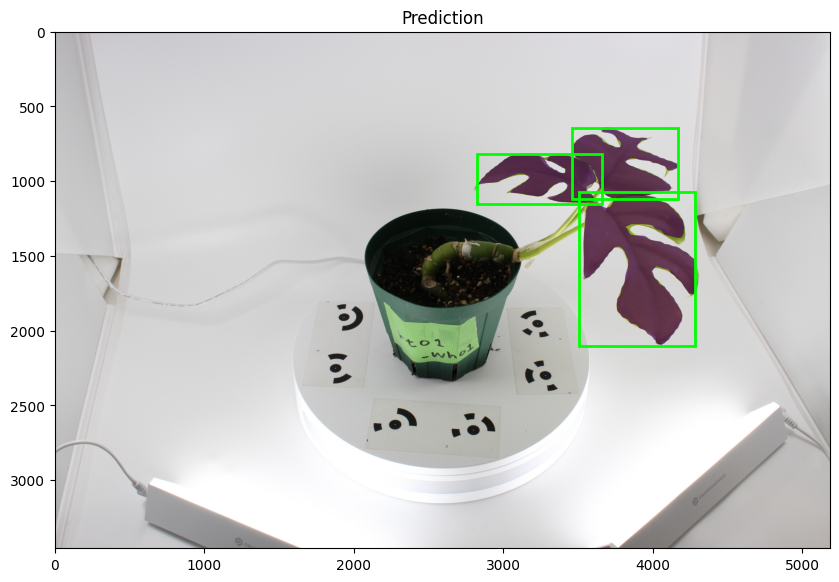

==> SSP_c01_s009_b0003.JPG - Detected 5 instances


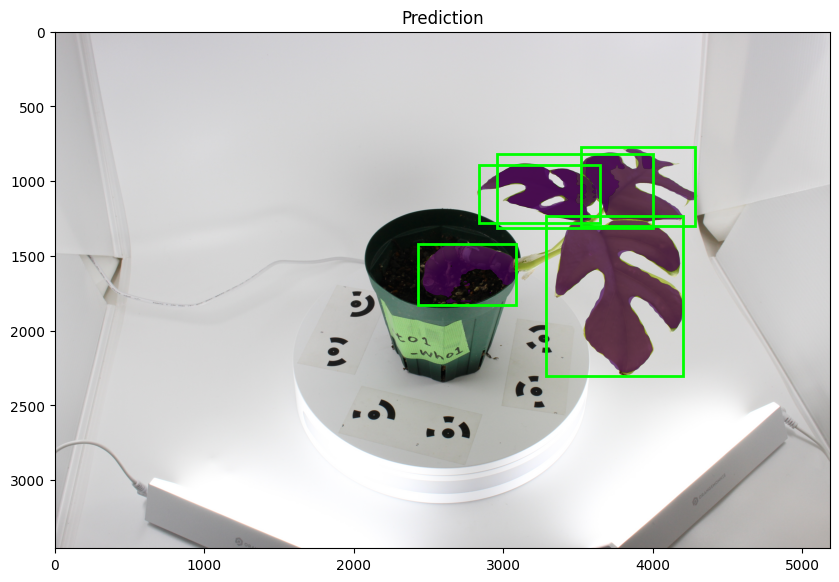

==> SSP_c01_s013_b0004.JPG - Detected 3 instances


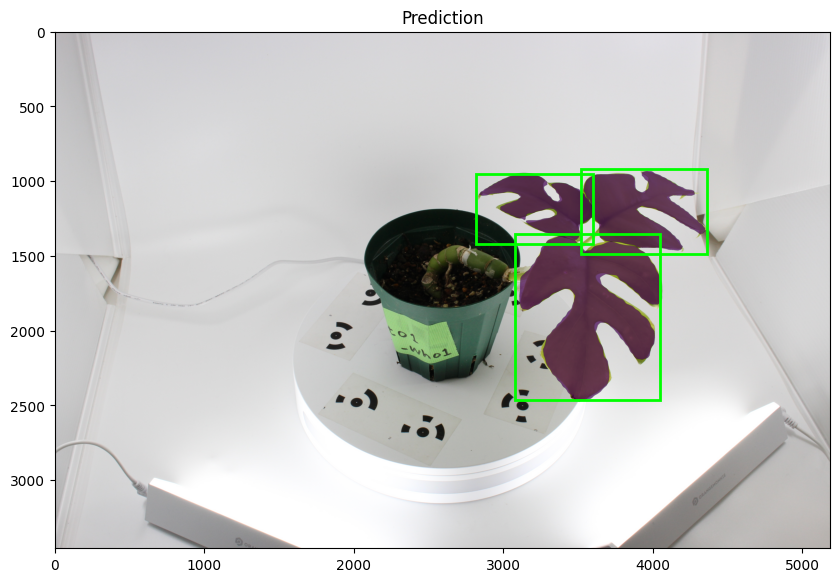

==> SSP_c01_s017_b0005.JPG - Detected 3 instances


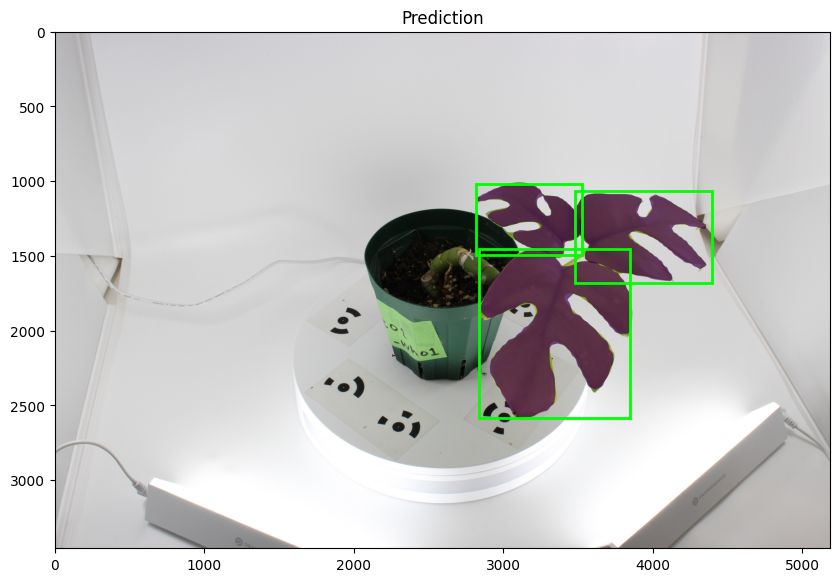

==> SSP_c01_s021_b0006.JPG - Detected 3 instances


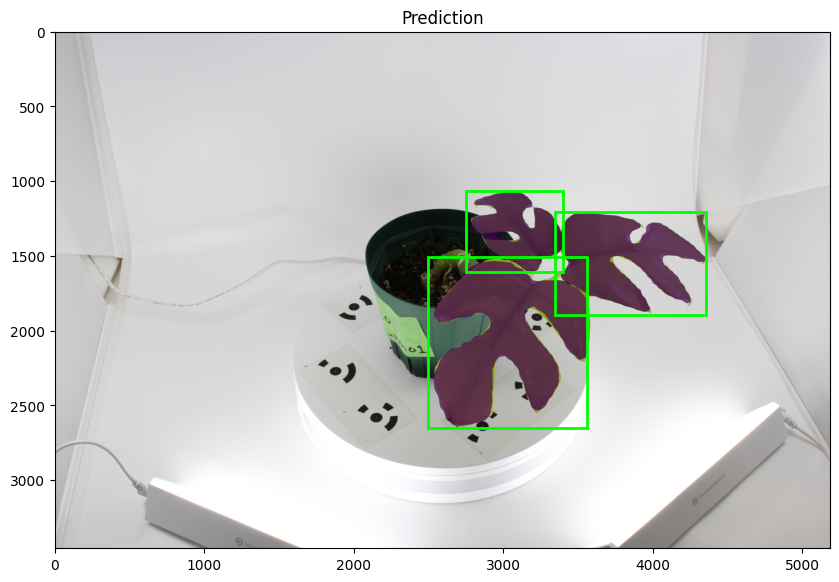

==> SSP_c01_s025_b0007.JPG - Detected 3 instances


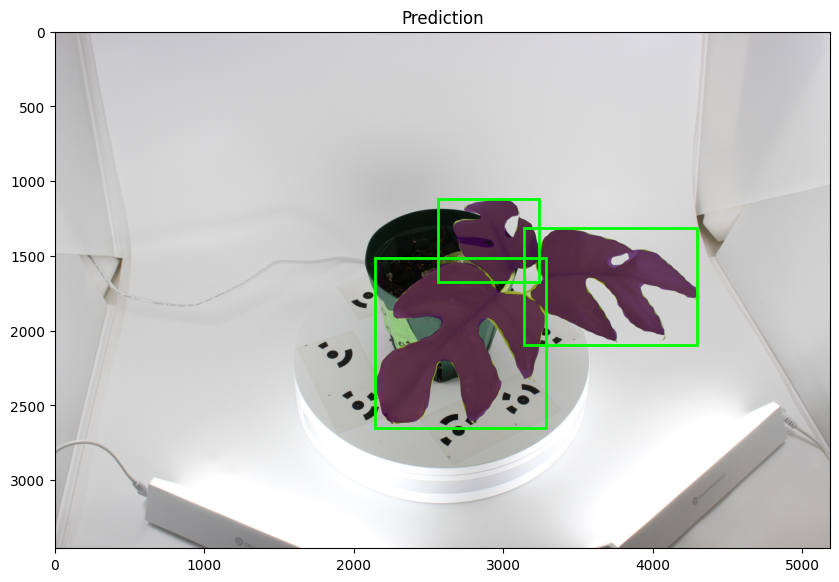

==> SSP_c01_s029_b0008.JPG - Detected 3 instances


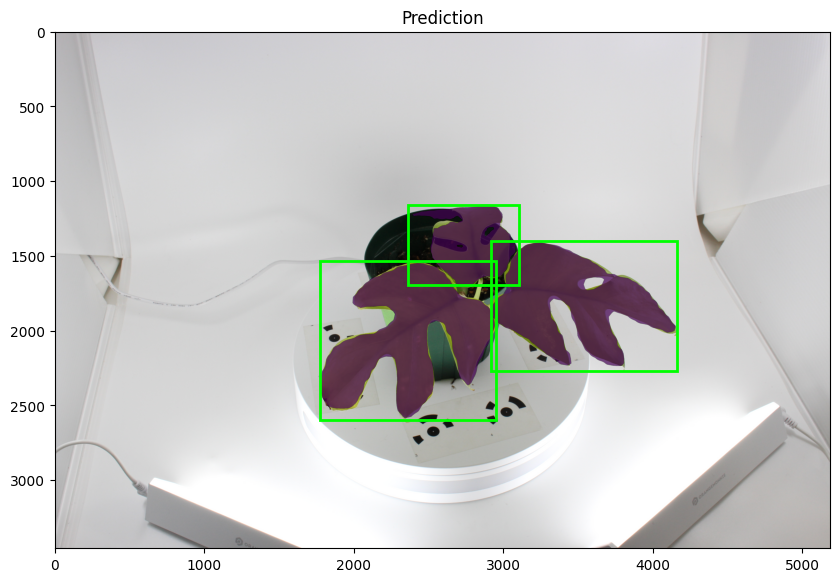

==> SSP_c01_s033_b0009.JPG - Detected 3 instances


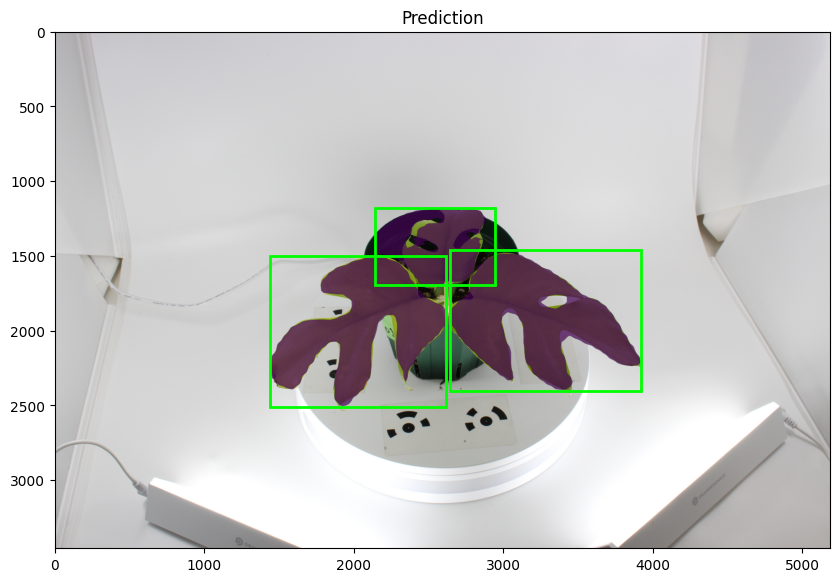

==> SSP_c01_s037_b0010.JPG - Detected 3 instances


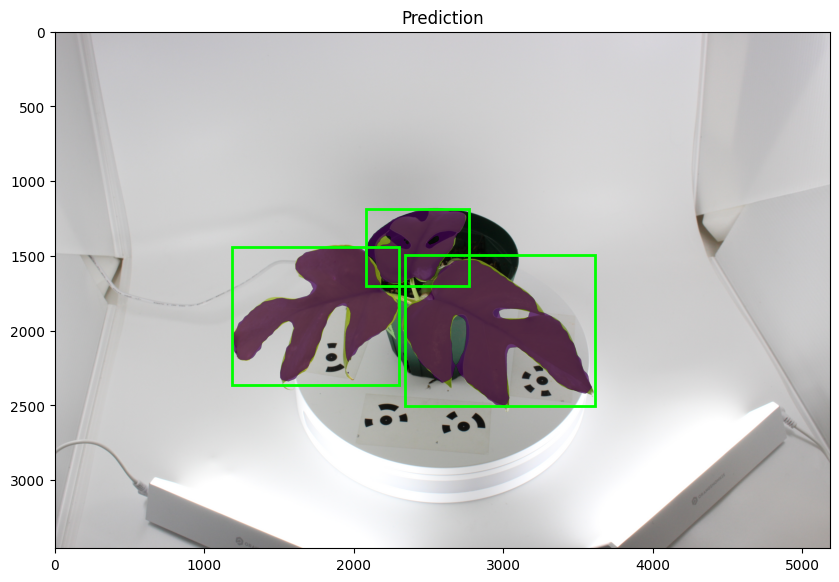

==> SSP_c01_s041_b0011.JPG - Detected 3 instances


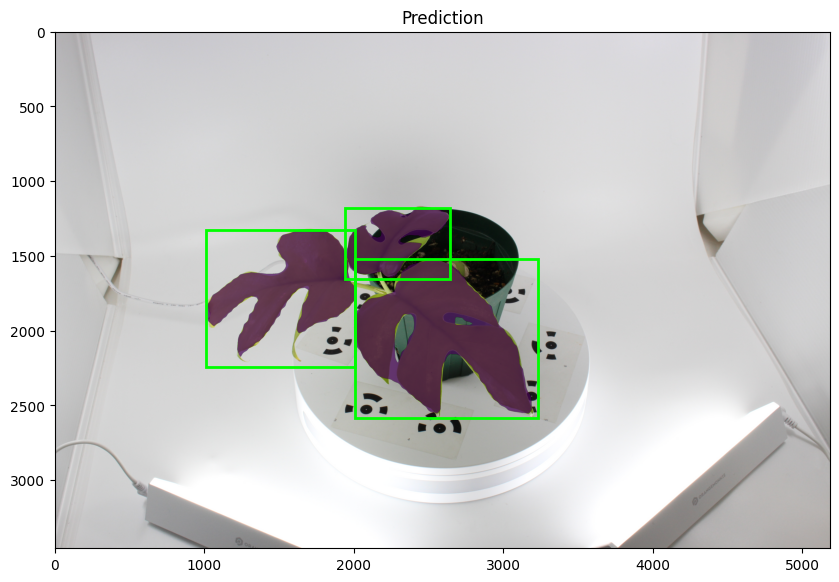

==> SSP_c01_s045_b0012.JPG - Detected 3 instances


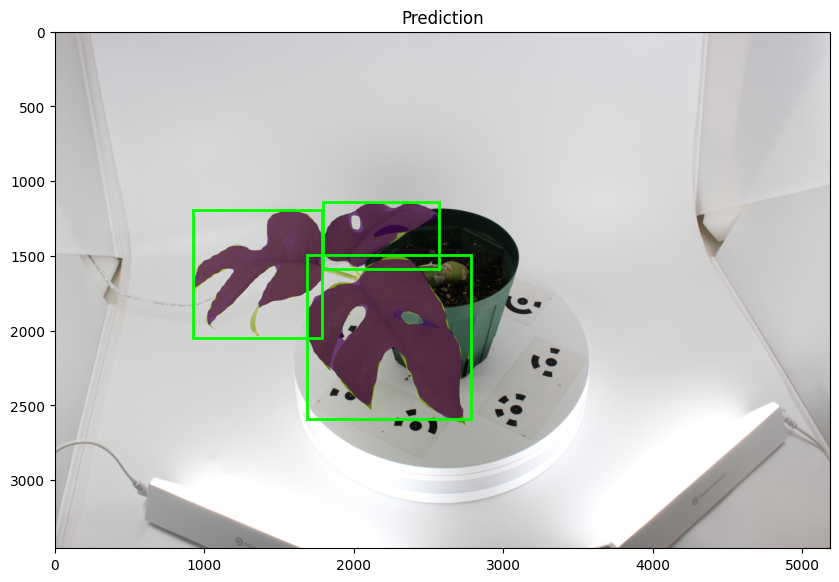

==> SSP_c01_s049_b0013.JPG - Detected 3 instances


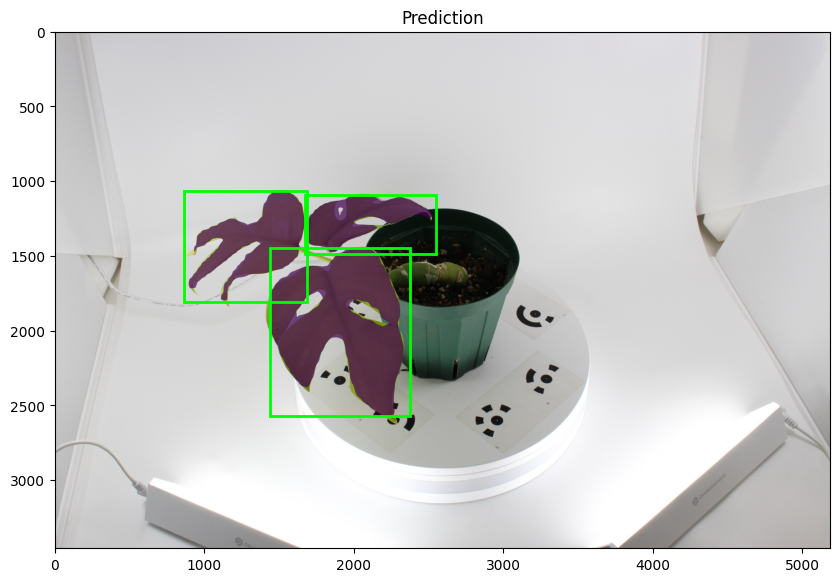

==> SSP_c01_s053_b0014.JPG - Detected 3 instances


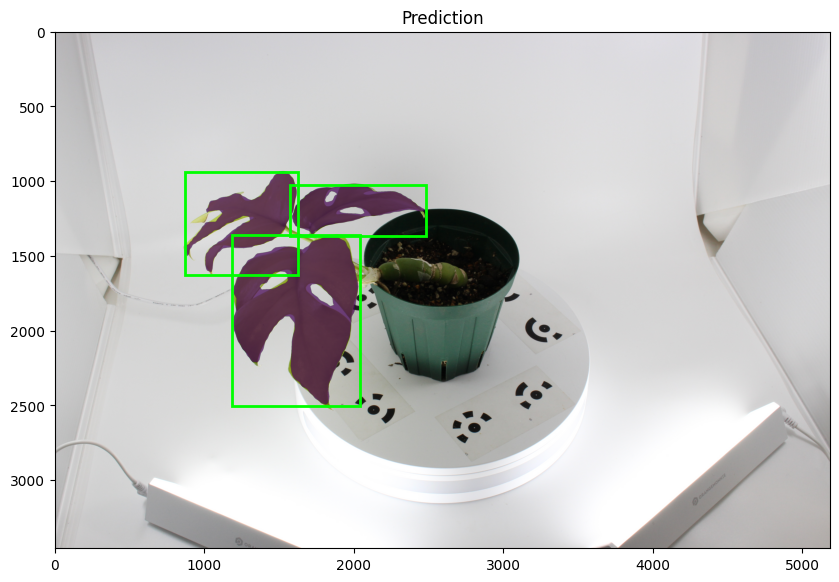

==> SSP_c01_s057_b0015.JPG - Detected 4 instances


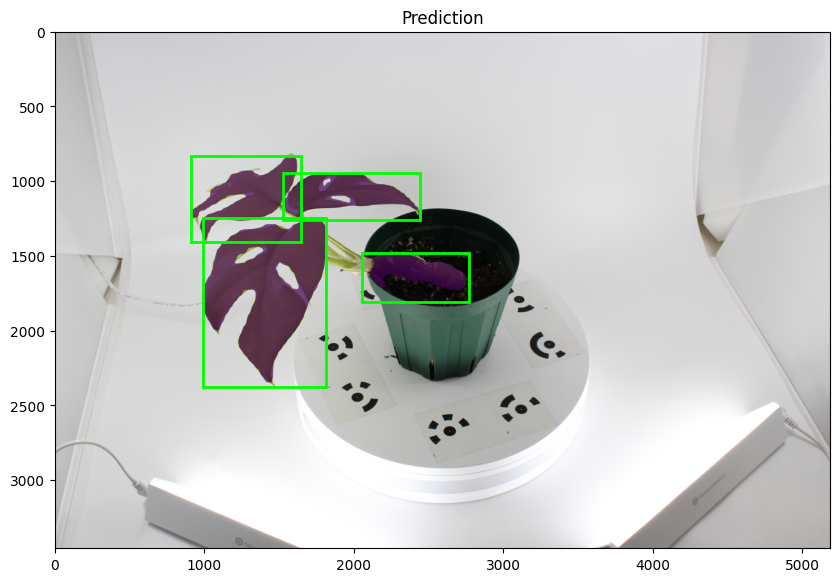

==> SSP_c01_s061_b0016.JPG - Detected 4 instances


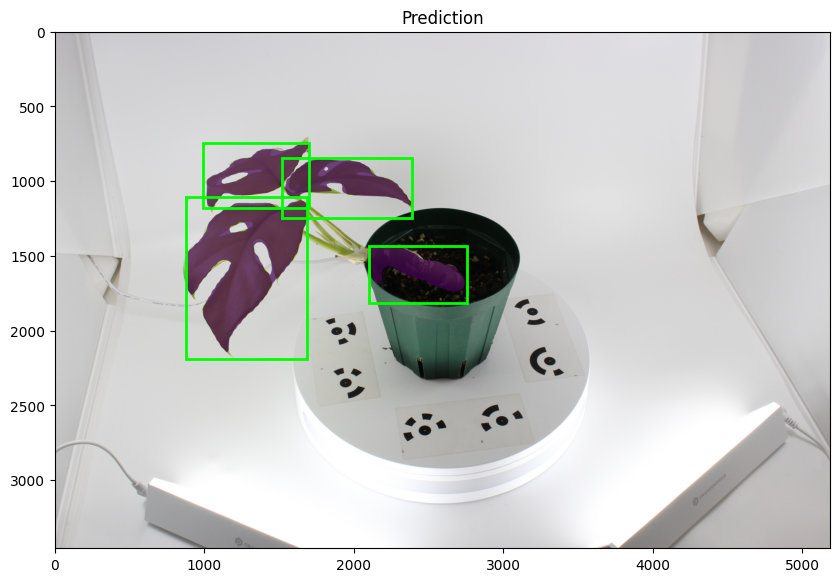

==> SSP_c01_s065_b0017.JPG - Detected 5 instances


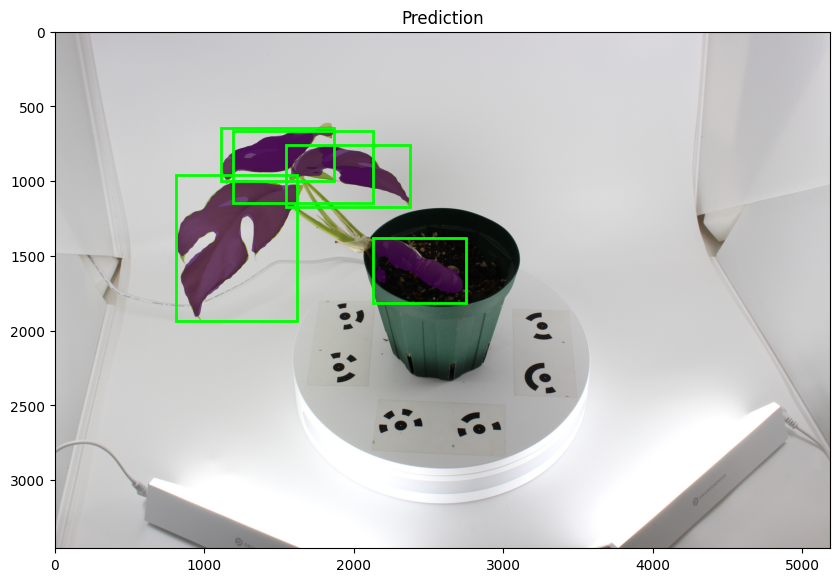

==> SSP_c01_s069_b0018.JPG - Detected 3 instances


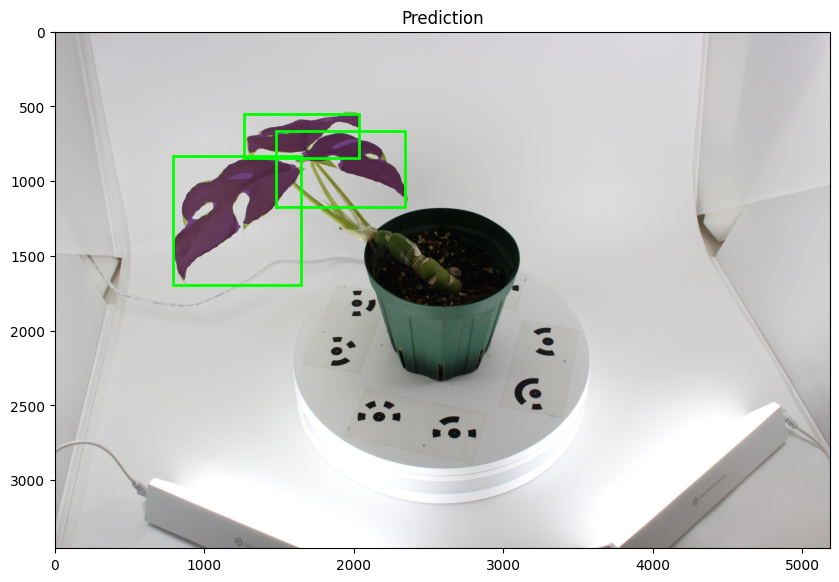

==> SSP_c01_s073_b0019.JPG - Detected 3 instances


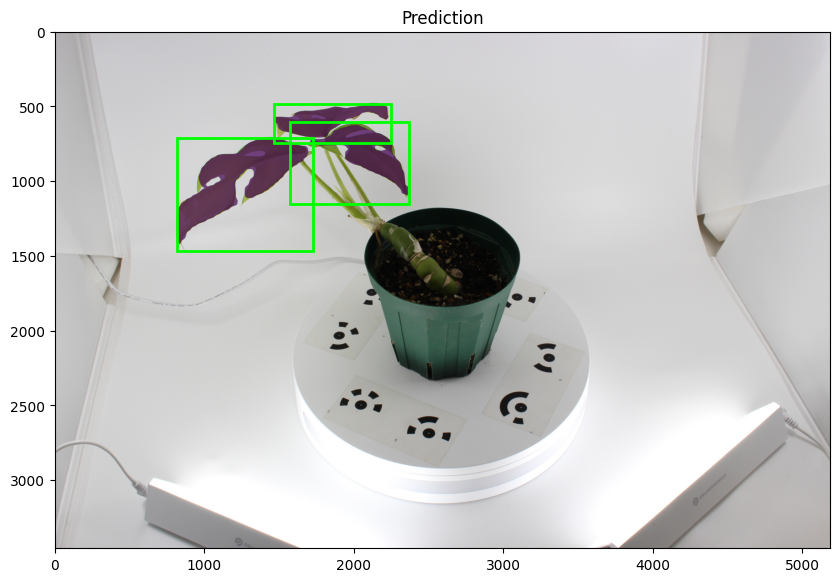

==> SSP_c01_s077_b0020.JPG - Detected 4 instances


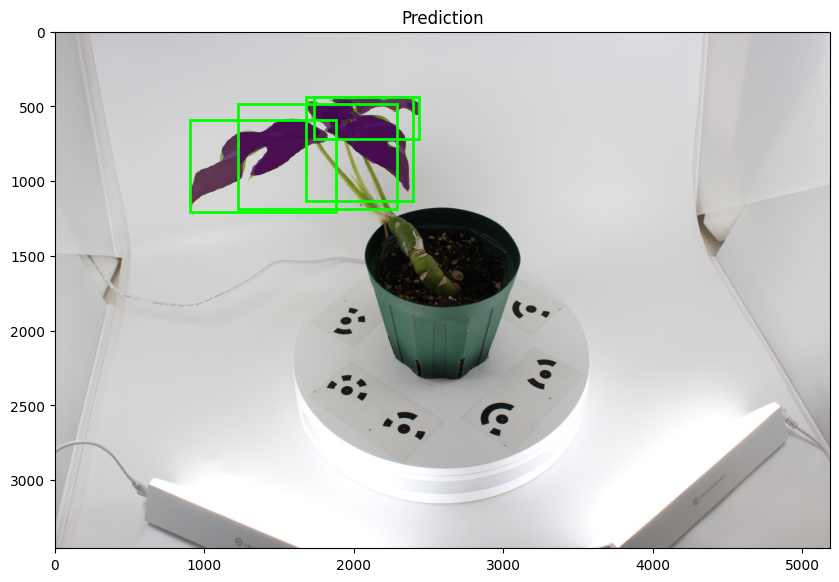

==> SSP_c01_s081_b0021.JPG - Detected 3 instances


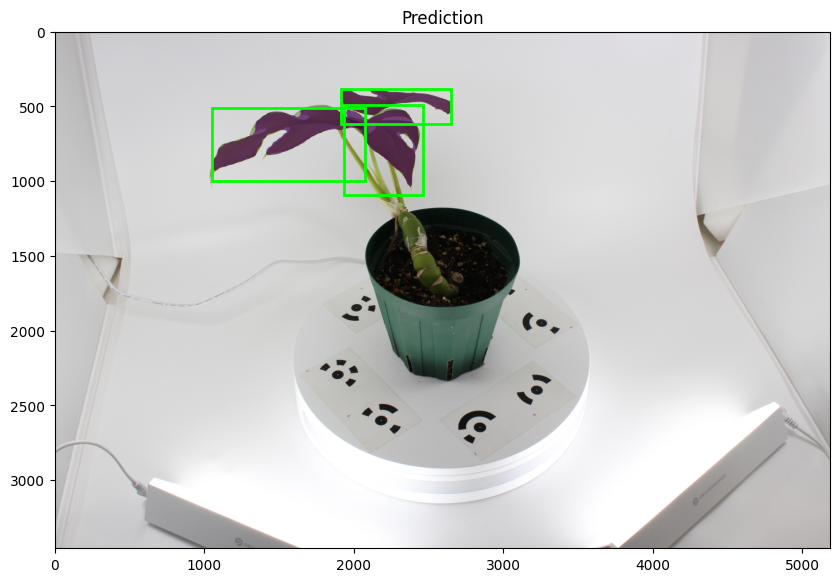

==> SSP_c01_s085_b0022.JPG - Detected 4 instances


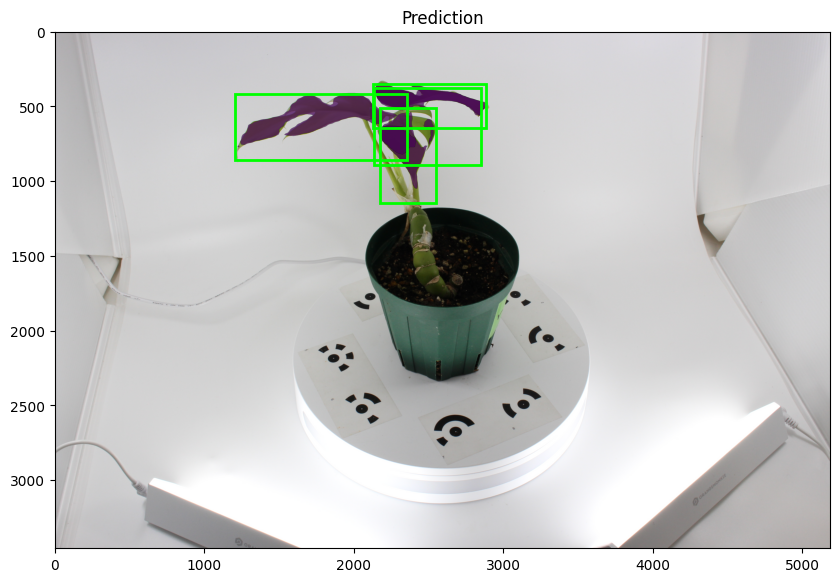

==> SSP_c01_s089_b0023.JPG - Detected 3 instances


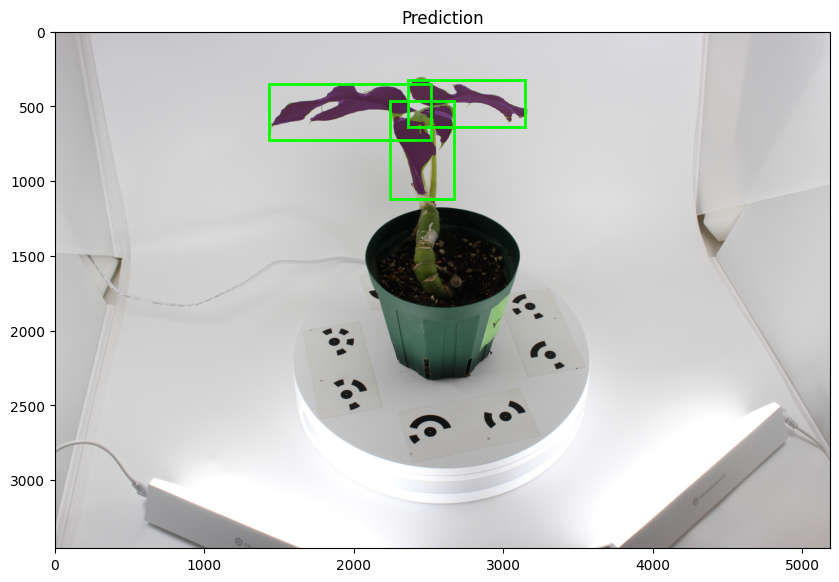

==> SSP_c01_s093_b0024.JPG - Detected 4 instances


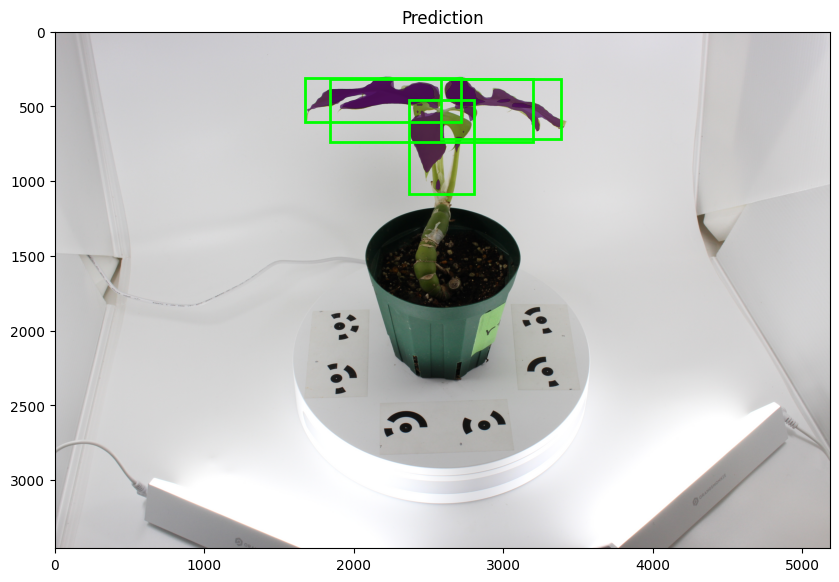

==> SSP_c01_s097_b0025.JPG - Detected 4 instances


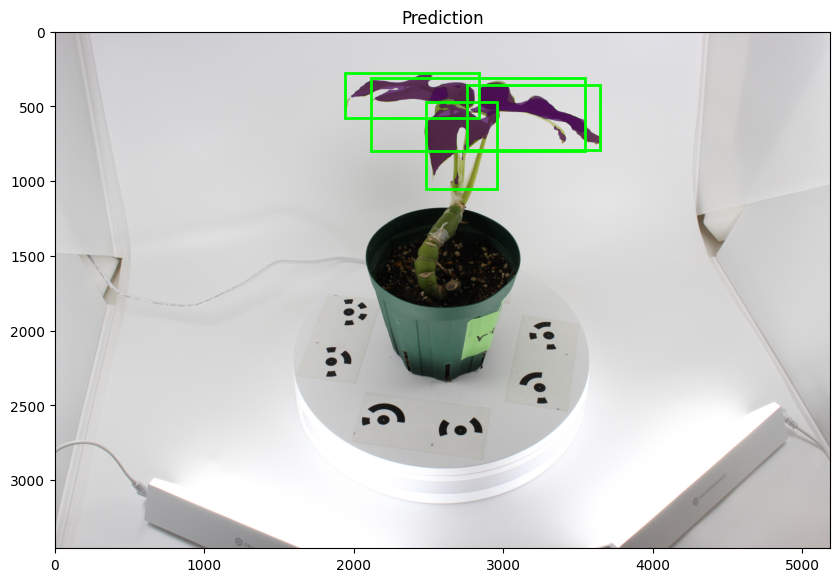

==> SSP_c01_s101_b0026.JPG - Detected 3 instances


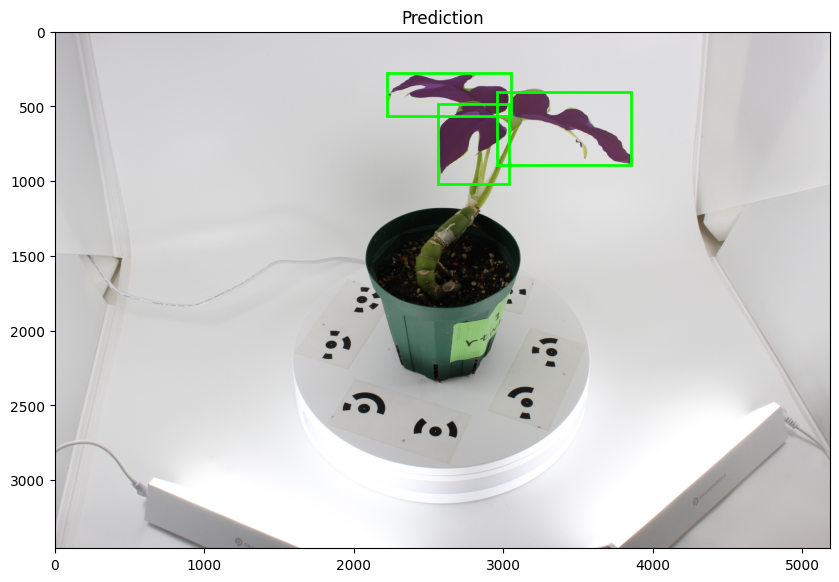

==> SSP_c01_s105_b0027.JPG - Detected 3 instances


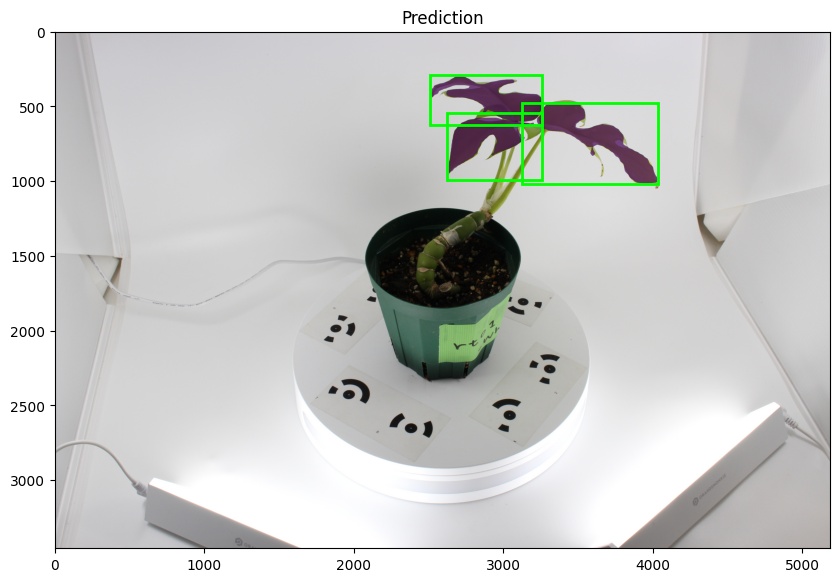

==> SSP_c01_s109_b0028.JPG - Detected 3 instances


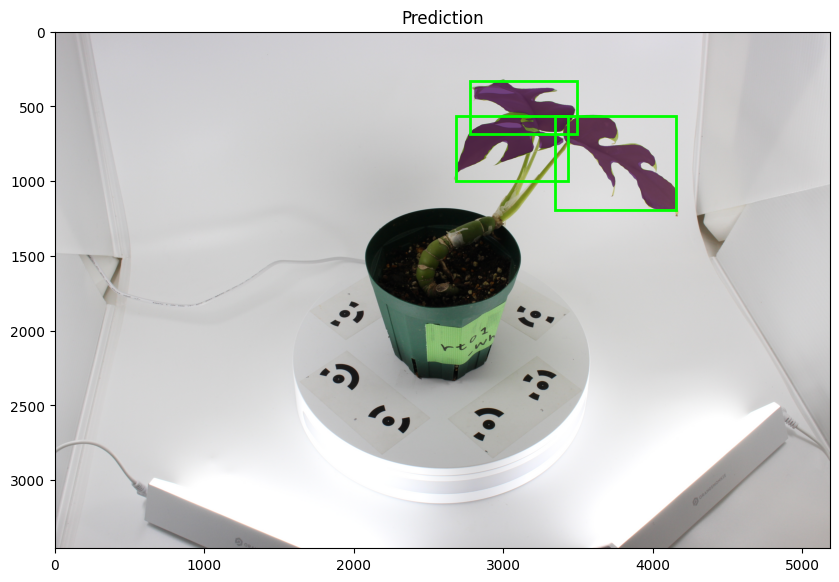

==> SSP_c01_s113_b0029.JPG - Detected 3 instances


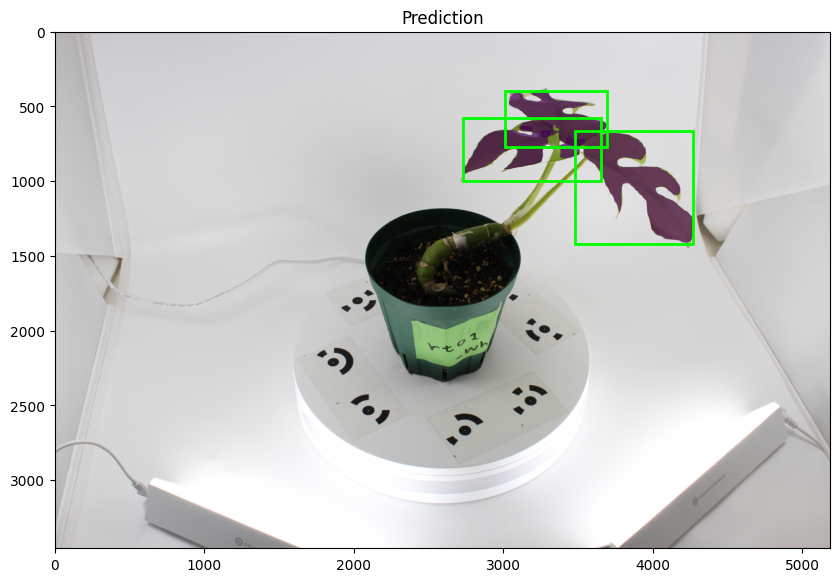

==> SSP_c01_s117_b0030.JPG - Detected 3 instances


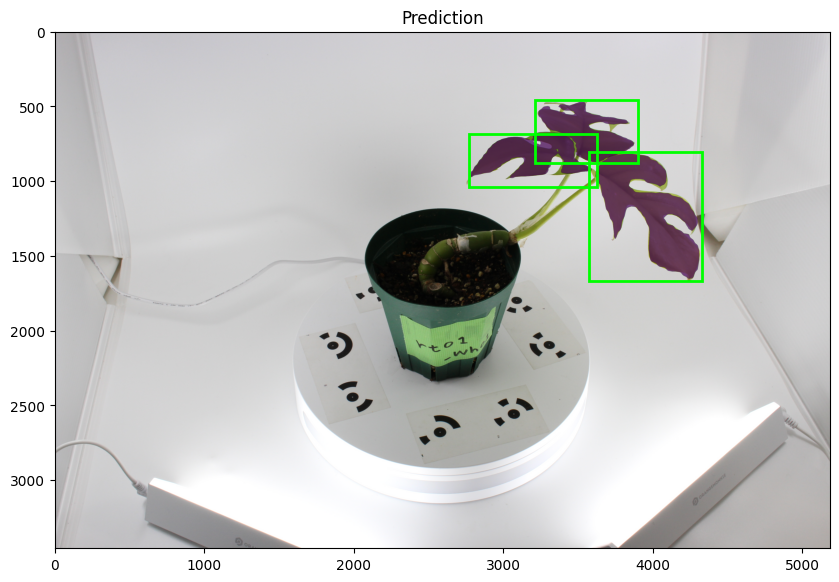

In [ ]:
run_inference_on_directory(
    model=model,
    image_dir="/content/drive/MyDrive/Mask_R_CNN_plants/raw/test_job18",  # ←適切なパスに変更(今は一旦お試しのテストデータ:job id_18)
    device=device,
    score_threshold=0.5,
    visualize=True
)